In [ ]:
#If th openai api key is not set already, please set it here.
import os
os.environ['OPENAI_API_KEY'] = 'your key'

In [1]:
import matplotlib
%matplotlib widget
from amadeusgpt.main import AMADEUS
from amadeusgpt.config import Config
import amadeusgpt
from pathlib import Path
import matplotlib.pyplot as plt
import cv2

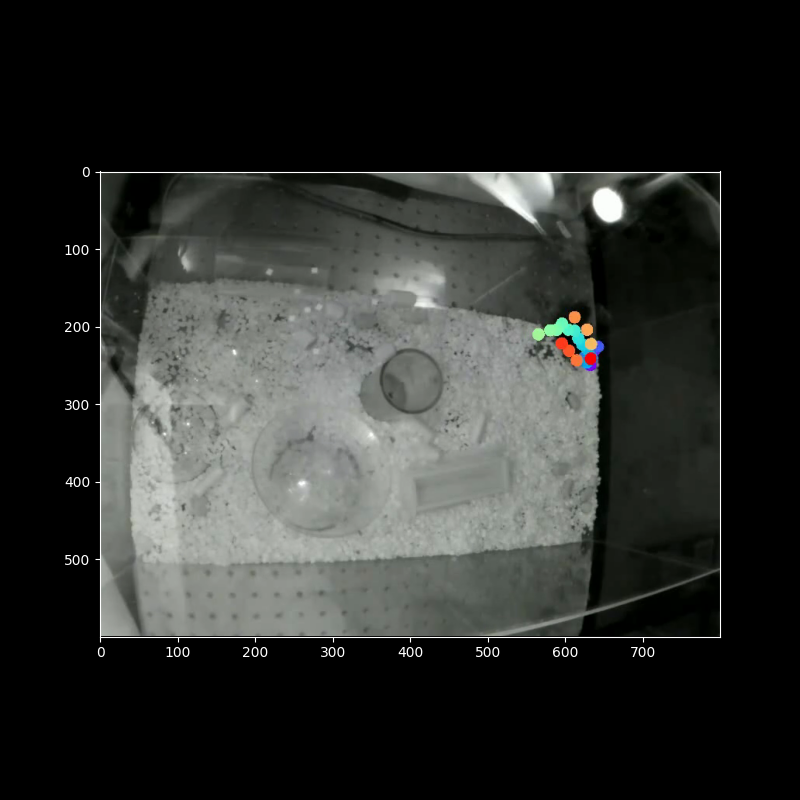

In [2]:
scene_frame_number = 400
amadeus_root = Path(amadeusgpt.__file__).parent.parent
config = Config(amadeus_root / "amadeusgpt/configs/MausHaus_template.yaml")

config['video_info']['scene_frame_number'] = scene_frame_number
config['keypoint_info']['keypoint_file_path'] = str(amadeus_root / config['keypoint_info']['keypoint_file_path'])
config['video_info']['video_file_path'] = str(amadeus_root / config['video_info']['video_file_path'])

video_path = config['video_info']['video_file_path'] 


cap = cv2.VideoCapture(video_path)

# Check if video opened successfully
if not cap.isOpened():
    print("Error: Could not open video.")
else:
    # Set the frame position
    cap.set(cv2.CAP_PROP_POS_FRAMES, scene_frame_number)
    # Read the frame
    ret, image = cap.read()

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
cap.release()
plt.imshow(image)
    

In [3]:
amadeus = AMADEUS(config)
behavior_analysis = amadeus.get_analysis()

INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"


current total cost 0.01 $
current total tokens 1086
The image shows a top view of an enclosure with bedding material, likely for small animals. There are various objects within the enclosure, including a circular dish, a transparent dome, and a rectangular object. There is a cluster of colored dots in the upper right corner, which might be used for tracking purposes.

Here is the filled json string based on the image:

```json
{
    "description": "Top view of an enclosure with bedding material and various objects, including a circular dish, a transparent dome, and a rectangular object. There is a cluster of colored dots in the upper right corner.",
    "individuals": 1,
    "species": "topview_mouse",
    "background_objects": ["circular dish", "transparent dome", "rectangular object"]
}
```


### Draw ROIs. Press Esc when you are done drawing each ROI

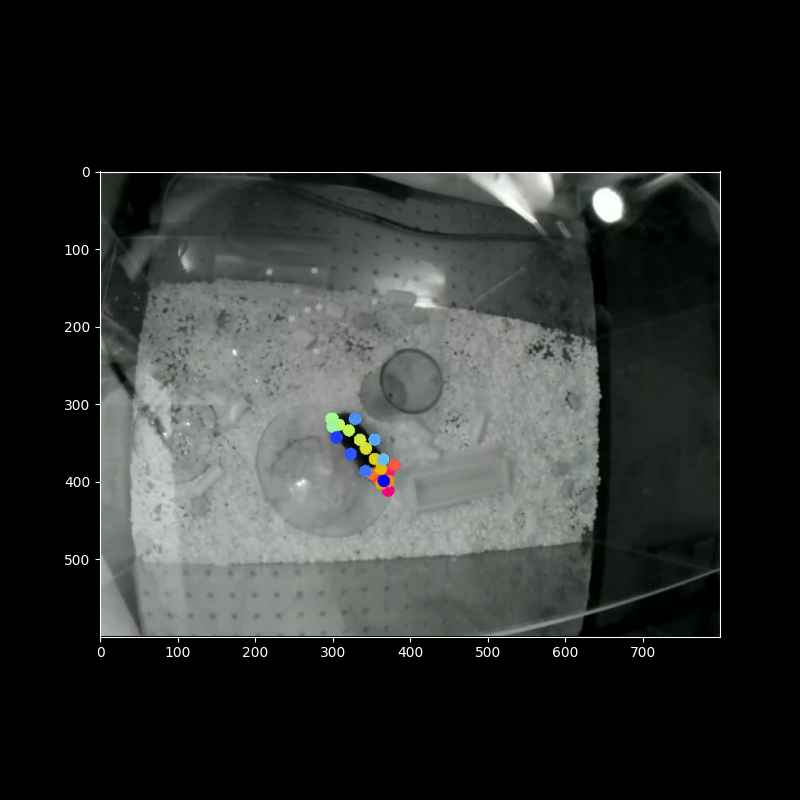

In [9]:
behavior_analysis.gui_manager.add_roi_from_video_selection()

In [6]:
from IPython.display import Markdown, display
from IPython.display import Video
def parse_result(amadeus, qa_message):
    display(Markdown(qa_message['chain_of_thought']))
    sandbox = amadeus.sandbox
    qa_message = sandbox.code_execution(qa_message)
    sandbox.render_qa_message(qa_message)
    print ('after executing the function')
    display(qa_message['meta_info'])
    print (f'videos generated to {qa_message["out_videos"]}')
    print ('Open it with media player if it does not properly display in the notebook')
    if qa_message['out_videos'] is not None:
        for video_path in qa_message['out_videos']:

            display(Video(video_path, embed=True))

    display(Markdown(str(qa_message['function_rets'])))

INFO:httpx:HTTP Request: POST https://api.openai.com/v1/embeddings "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"


current total cost 0.03 $
current total tokens 4275


To plot the trajectory of the animal using the animal center and color it by time, we can use the keypoints data provided by the `get_keypoints` function. Specifically, we will focus on the 'mouse_center' keypoint to represent the animal's center. 

We will follow these steps:
1. Retrieve the keypoints data.
2. Extract the coordinates of the 'mouse_center' keypoint for all frames.
3. Plot the trajectory of the 'mouse_center' keypoint, coloring the trajectory by time.

Let's proceed with the code:

```python
def plot_animal_trajectory(config: Config):
    """
    Plot the trajectory of the animal using the animal center and color it by time.

    Parameters:
    ----------
    config: Config
    """
    # Create an instance of AnimalBehaviorAnalysis
    analysis = create_analysis(config)
    
    # Get keypoints data
    keypoints = analysis.get_keypoints()  # shape: (n_frames, n_individuals, n_kpts, n_dims)
    
    # Get the number of frames
    n_frames = analysis.get_data_length()
    
    # Get the index of the 'mouse_center' keypoint
    keypoint_names = analysis.get_keypoint_names()
    mouse_center_index = keypoint_names.index('mouse_center')
    
    # Extract the coordinates of the 'mouse_center' keypoint for all frames
    mouse_center_coords = keypoints[:, 0, mouse_center_index, :]  # shape: (n_frames, 2)
    
    # Create a time array for coloring
    time = np.arange(n_frames)
    
    # Plot the trajectory
    fig, ax = plt.subplots()
    scatter = ax.scatter(mouse_center_coords[:, 0], mouse_center_coords[:, 1], c=time, cmap='viridis')
    ax.invert_yaxis()  # Invert y-axis to match image coordinates
    ax.set_xlim(0, 800)
    ax.set_ylim(600, 0)
    ax.set_title('Animal Trajectory Colored by Time')
    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')
    fig.colorbar(scatter, ax=ax, label='Time (frames)')
    
    return fig, ax
```

### Explanation:
1. **Retrieve Keypoints Data**: We use the `get_keypoints` function to get the keypoints data, which has the shape `(n_frames, n_individuals, n_kpts, n_dims)`.
2. **Extract 'mouse_center' Coordinates**: We find the index of the 'mouse_center' keypoint and extract its coordinates for all frames.
3. **Create Time Array**: We create a time array to use for coloring the trajectory.
4. **Plot Trajectory**: We plot the trajectory of the 'mouse_center' keypoint, coloring it by time. We invert the y-axis to match the image coordinates and set the x and y limits to cover the whole image.

This function will plot the trajectory of the animal's center and color it by time, providing a visual representation of the animal's movement over time.

after executing the function


{'description': 'Top-down view of an enclosure with bedding material, a circular dish, a cylindrical container, and a rectangular object. There is a cluster of colored dots in the upper right corner, likely representing tracking markers on an animal.',
 'individuals': 1,
 'species': 'topview_mouse',
 'background_objects': ['circular dish',
  'cylindrical container',
  'rectangular object']}

None


(<Figure size 800x800 with 2 Axes>, <Axes: title={'center': 'Animal Trajectory Colored by Time'}, xlabel='X Coordinate', ylabel='Y Coordinate'>)

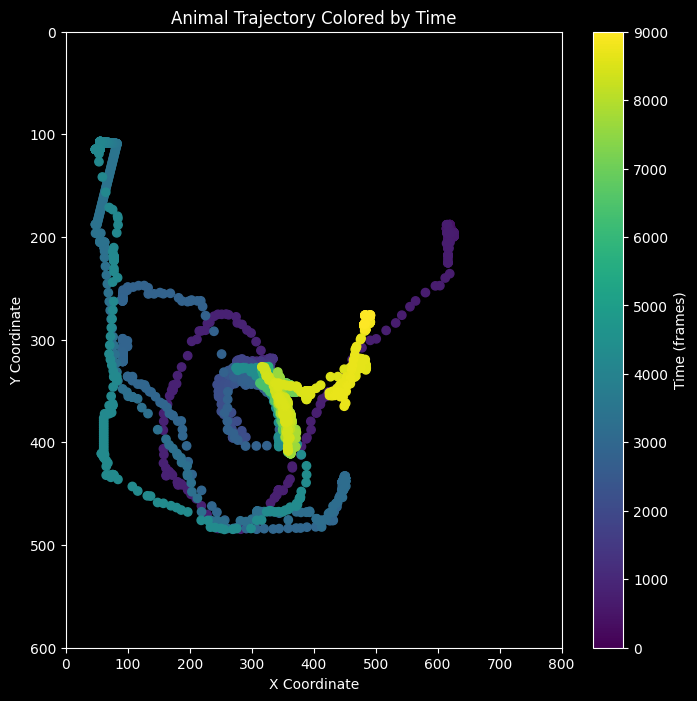

In [9]:
query = "Plot the trajectory of the animal using the animal center and color it by time"
qa_message = amadeus.step(query)
parse_result(amadeus, qa_message)

In [10]:
query = "When does the mouse move from ROI0 to ROI1?"
qa_message = amadeus.step(query)
parse_result(amadeus, qa_message)

INFO:httpx:HTTP Request: POST https://api.openai.com/v1/embeddings "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"


current total cost 0.06 $
current total tokens 9501


To determine when the mouse moves from ROI0 to ROI1, we need to identify events where the mouse transitions between these two regions of interest (ROIs). The core API provides a function `get_animals_object_events` that can be used to detect interactions between animals and objects, such as ROIs.

We can use this function to:
1. Detect when the mouse is inside ROI0.
2. Detect when the mouse is inside ROI1.
3. Combine these events to find transitions from ROI0 to ROI1.

We will use the `get_composite_events` function to combine these events sequentially, ensuring that the mouse first enters ROI0 and then moves to ROI1.

Here is the code to achieve this:

```python
def get_mouse_transition_events(config: Config):
    '''
    Parameters:
    ----------
    config: Config
    
    Returns:
    -------
    List[BaseEvent]
        A list of events where the mouse moves from ROI0 to ROI1.
    '''
    # create_analysis returns an instance of AnimalBehaviorAnalysis
    analysis = create_analysis(config)
    
    # Detect events where the mouse is inside ROI0
    roi0_events = analysis.get_animals_object_events(
        object_name='ROI0',
        query='overlap==True',
        negate=False,
        bodypart_names=None,
        min_window=1,
        max_window=100000
    )
    
    # Detect events where the mouse is inside ROI1
    roi1_events = analysis.get_animals_object_events(
        object_name='ROI1',
        query='overlap==True',
        negate=False,
        bodypart_names=None,
        min_window=1,
        max_window=100000
    )
    
    # Combine events to find transitions from ROI0 to ROI1
    transition_events = analysis.get_composite_events(
        events_A=roi0_events,
        events_B=roi1_events,
        composition_type='sequential',
        max_interval_between_sequential_events=15,
        min_window=1,
        max_window=100000
    )
    
    return transition_events
```

This function will return a list of events where the mouse moves from ROI0 to ROI1. The `max_interval_between_sequential_events` parameter is set to 15 frames, which can be adjusted based on the specific requirements of the analysis.

[<amadeusgpt.analysis_objects.object.ROIObject object at 0x2bc997f70>, <amadeusgpt.analysis_objects.object.ROIObject object at 0x2bca10a30>]
[<amadeusgpt.analysis_objects.object.ROIObject object at 0x2bc997f70>, <amadeusgpt.analysis_objects.object.ROIObject object at 0x2bca10a30>]
after executing the function


{'description': 'Top view of an enclosure with bedding material and various objects, including a circular dish, a transparent dome, and a rectangular object. There is a cluster of colored dots in the upper right corner.',
 'individuals': 1,
 'species': 'topview_mouse',
 'background_objects': ['circular dish',
  'transparent dome',
  'rectangular object']}

videos generated to None
Open it with media player if it does not properly display in the notebook


[]

INFO:httpx:HTTP Request: POST https://api.openai.com/v1/embeddings "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"


current total cost 0.08 $
current total tokens 12282


To answer the query accurately, we need to identify events where the mouse moves from ROI0 to ROI1 within an interval of less than 100 frames. The core API provides a function `get_animals_object_events` that can be used to retrieve events involving interactions between animals and objects (in this case, ROIs). 

We can use this function twice: once to get events where the mouse is in ROI0 and once to get events where the mouse is in ROI1. Then, we can use the `get_composite_events` function to combine these events sequentially, ensuring the interval between the two events is less than 100 frames.

Here is the code to achieve this:

```python
def get_mouse_movement_events(config: Config):
    '''
    Parameters:
    ----------
    config: Config
    '''
    # create_analysis returns an instance of AnimalBehaviorAnalysis
    analysis = create_analysis(config)
    
    # Get events where the mouse is in ROI0
    roi0_events = analysis.get_animals_object_events(
        object_name='ROI0',
        query='overlap==True',
        negate=False,
        bodypart_names=None,
        min_window=1,
        max_window=100000
    )
    
    # Get events where the mouse is in ROI1
    roi1_events = analysis.get_animals_object_events(
        object_name='ROI1',
        query='overlap==True',
        negate=False,
        bodypart_names=None,
        min_window=1,
        max_window=100000
    )
    
    # Combine the events sequentially with a maximum interval of 100 frames
    movement_events = analysis.get_composite_events(
        events_A=roi0_events,
        events_B=roi1_events,
        composition_type='sequential',
        max_interval_between_sequential_events=100,
        min_window=1,
        max_window=100000
    )
    
    return movement_events
```

This function will return the events where the mouse moves from ROI0 to ROI1 within an interval of less than 100 frames.

[<amadeusgpt.analysis_objects.object.ROIObject object at 0x2bc997f70>, <amadeusgpt.analysis_objects.object.ROIObject object at 0x2bca10a30>]
[<amadeusgpt.analysis_objects.object.ROIObject object at 0x2bc997f70>, <amadeusgpt.analysis_objects.object.ROIObject object at 0x2bca10a30>]


OpenCV: FFMPEG: tag 0x34363268/'h264' is not supported with codec id 27 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x31637661/'avc1'
OpenCV: FFMPEG: tag 0x34363268/'h264' is not supported with codec id 27 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x31637661/'avc1'


out videosout videosout videosout videosout videosout videosout videosout videosout videosout videos
['event_clips/maushaus_trimmedDLC_snapshot-1000_labeled_x264_get_mouse_movement_events_video_0.mp4', 'event_clips/maushaus_trimmedDLC_snapshot-1000_labeled_x264_get_mouse_movement_events_video_1.mp4']
after executing the function


{'description': 'Top view of an enclosure with bedding material and various objects, including a circular dish, a transparent dome, and a rectangular object. There is a cluster of colored dots in the upper right corner.',
 'individuals': 1,
 'species': 'topview_mouse',
 'background_objects': ['circular dish',
  'transparent dome',
  'rectangular object']}

videos generated to ['event_clips/maushaus_trimmedDLC_snapshot-1000_labeled_x264_get_mouse_movement_events_video_0.mp4', 'event_clips/maushaus_trimmedDLC_snapshot-1000_labeled_x264_get_mouse_movement_events_video_1.mp4']
Open it with media player if it does not properly display in the notebook


[<amadeusgpt.analysis_objects.event.Event object at 0x2bd62b7c0>, <amadeusgpt.analysis_objects.event.Event object at 0x2bd62ada0>]

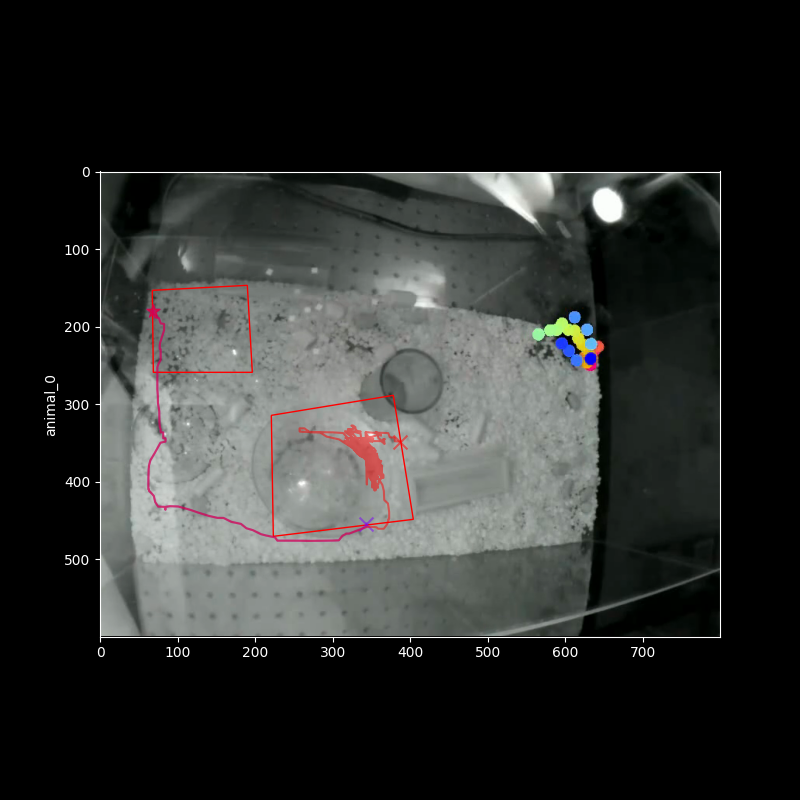

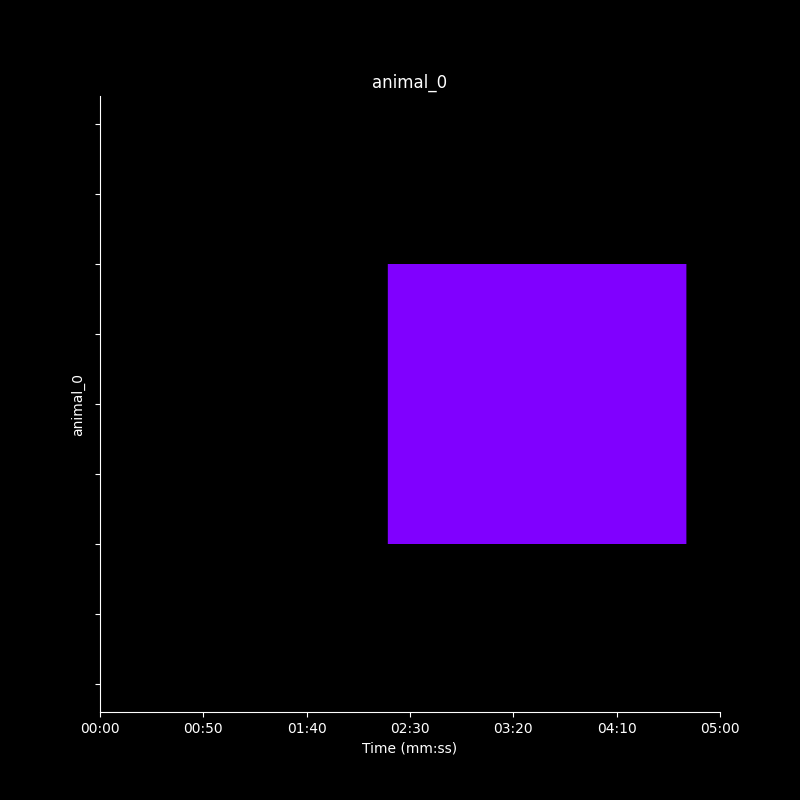

In [11]:
query = "When does the mouse move from ROI0 to ROI1. The interval should be less than 100 frames"
qa_message = amadeus.step(query)
parse_result(amadeus, qa_message)